In [2]:
import glob
import io
import json
import math
import pickle
import random
import re
import string
from urllib.parse import quote
from urllib.request import urlopen

import community
import matplotlib.pyplot as plt
import networkx as nx
import nltk
import numpy as np
import pandas as pd
from fa2 import ForceAtlas2
from nltk import FreqDist
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from tqdm.notebook import tqdm
from wordcloud import WordCloud

random.seed(42)
np.random.seed(42)

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')


[nltk_data] Downloading package punkt to C:\Users\Dr. Vjotel
[nltk_data]     Frantzwag\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.
[nltk_data] Downloading package stopwords to C:\Users\Dr. Vjotel
[nltk_data]     Frantzwag\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.
[nltk_data] Downloading package wordnet to C:\Users\Dr. Vjotel
[nltk_data]     Frantzwag\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\wordnet.zip.


True

 # Preparation - creating hero graph

In [3]:
# Constants setup
urls = [
    'https://raw.githubusercontent.com/SocialComplexityLab/socialgraphs2020/master/files/marvel_characters.csv',
    'https://raw.githubusercontent.com/SocialComplexityLab/socialgraphs2020/master/files/dc_characters.csv'
]
universes = ['marvel', 'dc']

# Base query for all the upcoming queries
baseurl = 'https://en.wikipedia.org/w/api.php?'
action = 'action=query'
content = 'prop=revisions&rvprop=content'
dataformat = 'format=json'
formatversion = 'formatversion=2'
query_base = f'{baseurl}{action}&{content}&{dataformat}&{formatversion}&titles='
wikilink_re = re.compile(r'\[\[(.*?)\]\]')


In [4]:
# Functions for getting and preparing the data
def prepare_data(df):
    '''
    Prepares the dataframe for further analysis.\n
    Drops rows with ';' in 'WikiLink' column.\n
    Drops rows with NaNs.\n
    Drops rows with duplicates in 'WikiLink' column.\n
    Adds column with URL-ready WikiLinks (i.e. undescores instead of spaces).
    '''
    df.loc[df['WikiLink'] == ';', 'WikiLink'] = np.NaN
    df = df.dropna()
    df = df.drop_duplicates('WikiLink')
    df['WikiLink'] = df['WikiLink'].str.replace(';', '')
    df['WikiLink_url'] = df['WikiLink'].str.replace(' ', '_')
    return df


def get_preprocessed_csv_data(urls, universes):
    '''
    Returns dictionary with:\n
    keys - universes\n
    values - dataframes with data from provided urls
    '''
    data = {}
    for i, univ in enumerate(universes):
        data[univ] = pd.read_csv(urls[i], sep='|', index_col=0, header=0,
                                 names=['CharacterName', 'WikiLink'])
        data[univ] = prepare_data(data[univ])
    return data


def get_wiki_page(title):
    '''
    Returns content of the wikipage with specified title or None if it does not exist
    '''
    query = f'{query_base}{quote(title)}'  # quote escapes weird Unicode characters
    wikijson = json.loads(urlopen(query).read())
    try:
        return wikijson['query']['pages'][0]['revisions'][0]['content']
    except Exception:
        return None


def save_pages_from_df(df, dir='output'):
    '''
    Fetches all the wikipages from the dataframe and stores them as text files in the specified directory
    '''

    def create_file_from_wiki(row):
        filename = row['CharacterName']
        page = get_wiki_page(row['WikiLink_url'])
        if page is None:
            print('No page for', row['WikiLink_url'])
            return
        with io.open(f'{dir}/{filename}.txt', 'w', encoding='utf8') as f:
            f.write(page)

    df.apply(create_file_from_wiki, axis=1)


def get_wikilinks(text):
    '''
    Return all wikilinks in a given text
    '''
    wikilinks = set()
    for link in wikilink_re.finditer(text):
        wikilinks.add(link[1].split('|')[0])
    return wikilinks


def filter_hero_links(wikilinks, hero_wikilinks):
    '''
    Returns intersection between wikilinks and hero wikilinks
    '''
    return set(wikilinks).intersection(set(hero_wikilinks))


In [5]:
# Functions for graph building
def add_heroes_to_graph(heroes, universe):
    '''
    Adds hero nodes with specified universe attribute to the hero graph
    '''
    hero_graph.add_nodes_from(heroes, universe=universe)


def add_edges_to_graph(source, nodes):
    '''
    Connects given source to all the nodes in the hero graph
    '''
    for node in nodes:
        hero_graph.add_edge(source, node)


def update_graph_with_hero(hero, links, universe):
    '''
    Updates hero graph with information about given hero and links.
    '''
    hero_graph.add_node(hero, universe=universe)
    for univ in universes:
        univ_links = data[univ]['WikiLink']
        linked_heroes = filter_hero_links(links, univ_links)
        add_heroes_to_graph(linked_heroes, univ)
        add_edges_to_graph(hero, linked_heroes)


def update_graph(row, universe):
    '''
    Updates hero graph with information from a row.
    Determines proper nodes & connections from corresponding text file.
    '''
    filename, current_hero = row['CharacterName'], row['WikiLink']
    try:
        with io.open(f'{universe}/{filename}.txt', 'r', encoding='utf8') as f:
            page_content = f.read()
            wikilinks = get_wikilinks(page_content)
        update_graph_with_hero(current_hero, wikilinks, universe)
    except Exception:
        pass


def remove_isolates(graph):
    '''
    Removes isolated nodes from the graph
    '''
    graph.remove_nodes_from(list(nx.isolates(graph)))


def get_gcc(graph):
    '''
    Return subgraph with Giant Connected Component
    '''
    return graph.subgraph(sorted(nx.weakly_connected_components(graph), key=len, reverse=True)[0])


In [6]:
# Get data & build the hero graph for exercises
data = get_preprocessed_csv_data(urls, universes)
# for univ in universes: # Uncomment if you want to download all the pages!
# 	save_pages_from_df(data[univ], univ)

hero_graph = nx.DiGraph()
for univ in universes:
    data[univ].apply(update_graph, args=(univ,), axis=1)
remove_isolates(hero_graph)
hero_graph = get_gcc(hero_graph)


IndexError: list index out of range

  # Exercise 1: Visualize the network (from lecture 5) and calculate basic stats (from lecture 4). For this exercise, we assume that you've already generated the network of superheroes, report work on the giant connected component.
  Here's what you need to do:
  ## Exercise 1a: Stats (see lecture 4 for more hints)

  ### What is the number of nodes in the network?
  ### What is the number of links?

In [6]:
print('Number of nodes in GCC:', len(hero_graph.nodes))
print('Number of links in GCC:', len(hero_graph.edges))


Number of nodes in GCC: 2356
Number of links in GCC: 35751


  > ### Answer:
  > There are 2356 nodes and 35751 links in giant connected component of the hero graph.

  ### What is the number of links connecting Marvel and DC? Explain in your own words what those links mean?

In [7]:
def count_cross_universe_links(node, graph):
    '''
    Counts number of connections to other universe from a given node
    '''
    universe = node[1]['universe']
    return np.sum((1 if graph.nodes[n]['universe'] != universe else 0 for n in graph.neighbors(node[0])))


total_links = np.sum((count_cross_universe_links(n, hero_graph) for n in hero_graph.nodes(data=True)))

print('Number of cross-universe links', total_links)


Number of cross-universe links 802


  > ### Answer:
  > There are 802 links between Marvel and DC. It may mean that, although these are 'rival' publishers, there is slight relationship between their characters. However, it is small, as only around 2 percent of the links are cross-universe.

  ### Who are top 5 most connected characters? (Report results for in-degrees and out-degrees). Comment on your findings. Is this what you would have expected.

In [8]:
def report_heroes(degrees, dir):
    '''
    Prints information about 5 most connected heroes according to the edge directions
    '''
    top = sorted(degrees, key=lambda x: x[1], reverse=True)[:5]
    print(f'Top 5 connected heroes with {dir} links')
    print(f'{"name:": <35}{dir} links:')
    for h in top:
        print(f'{h[0]: <35}{h[1]}')


report_heroes(hero_graph.in_degree(), 'entering')
print()
report_heroes(hero_graph.out_degree(), 'exiting')


Top 5 connected heroes with entering links
name:                              entering links:
Superman                           520
Batman                             498
Spider-Man                         457
Captain America                    413
Justice League                     407

Top 5 connected heroes with exiting links
name:                              exiting links:
Hood (comics)                      130
Venom (Marvel Comics character)    99
New Warriors#Folding Circle        93
New Warriors#Enemies               93
Psylocke                           84


  > ### Answer:
  > Top 5 heroes with highest in- and out-degree can be seen above. First of all, it is surprising, how big is the difference between number of entering and exiting links - the most linked-to character has 4x more links than the most linking-to character. Intuition may suggest that those numbers should be similar. Also, the difference between the lists is similar - theoretically the character with the most outgoing links should have high number of entering links, as it is obviously related to multiple other heroes. However, it is not the case, as top 5 for in- and out-degrees consists of completely different characters.

  ### Plot the in and out-degree distributions.
  #### a) Explain what you observe?
  #### b) Explain why the in-degree distribution is different from the out-degree distribution?

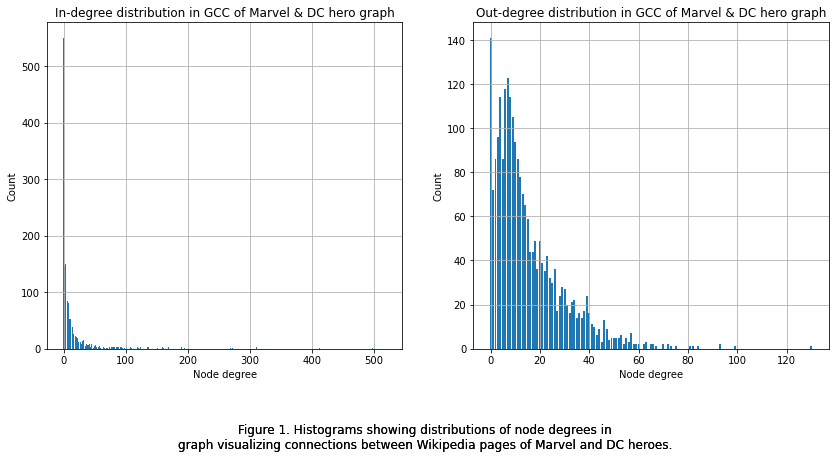

In [9]:
gcc_in_degrees = [degree for _, degree in hero_graph.in_degree()]
gcc_out_degrees = [degree for _, degree in hero_graph.out_degree()]


def barchart_distributions(data, title, caption, xlabel='', ylabel='', subplot=111):
    '''
    Wrapper around various pyplot configuration options
    '''
    plt.subplot(subplot)
    vector = list(range(np.min(data), np.max(data) + 2))
    graph_values, graph_bins = np.histogram(data, bins=vector)
    plt.bar(graph_bins[:-1], graph_values, width=.8)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid()
    plt.figtext(0.5, -0.1, caption, wrap=True, horizontalalignment='center', fontsize=12)


plt.figure(figsize=(14, 6))
caption = 'Figure 1. Histograms showing distributions of node degrees in\ngraph visualizing connections between Wikipedia pages of Marvel and DC heroes.'
title = 'In-degree distribution in GCC of Marvel & DC hero graph'
barchart_distributions(gcc_in_degrees, title, caption, 'Node degree', 'Count', 121)
title = 'Out-degree distribution in GCC of Marvel & DC hero graph'
barchart_distributions(gcc_out_degrees, title, caption, 'Node degree', 'Count', 122)
plt.show()


  > ### Answer:
  > First of all, out-degrees have 4 several times smaller range of values (according to the previous exercise - 1-130 vs 1-520). They are more condensed and distribution changes slower than in in-degree - there are around 140 nodes with degree 1 (not 0, as isolated nodes were removed), but there are also slightly more than 120 nodes with degree around 10. In-degree changes rapidly from around 550 nodes with degree 1 to just around 150 with degree of approximately 10.
  > The in-degree distribution may reach higher values because of the nature of the network - the articles about heroes on wikipedia were created according to Barabasi-Albert model, i.e. one article was added after another and could link only to the previously created articles, with the first one (then second, third etc.) being probably the most popular. Because of that, after several articles were created they were mostly linking to the several most popular, thus increasing their in-degree.

  ### Compare the degree distribution to a random network with the same number of nodes and probability of connection $p$. Comment or your results.

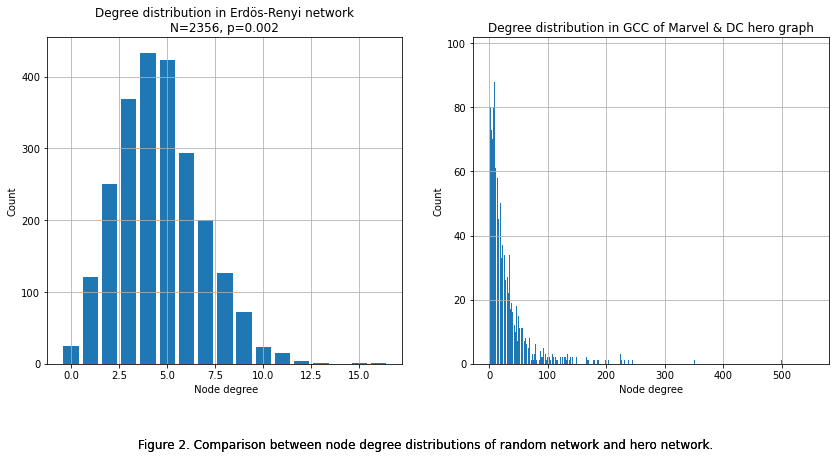

In [10]:
size, p = hero_graph.order(), 0.002
random_network = nx.erdos_renyi_graph(size, p)
random_degrees = [degree for _, degree in random_network.degree()]
gcc_degrees = [degree for _, degree in hero_graph.degree()]
plt.figure(figsize=(14, 6))
caption = 'Figure 2. Comparison between node degree distributions of random network and hero network.\n'
title = f'Degree distribution in Erdös-Renyi network\nN={size}, p={p}'
barchart_distributions(random_degrees, title, caption, ' Node degree', 'Count', 121)
title = f'Degree distribution in GCC of Marvel & DC hero graph'
barchart_distributions(gcc_degrees, title, caption, 'Node degree', 'Count', 122)
plt.show()


  > ### Answer:
  > Random network with N=2356, p=0.002 and hero network with the same number of nodes have very different node distributions. As hero network follows the power-law, there are many nodes with low degree and few with high degree creating 'hubs'. Random network follows normal distribution, so for mentioned N and p there are mostly nodes with 4 connections and the number of nodes decreases the further the degree from 4.

  ## Exercise 1b: Visualization (see lecture 5 for more hints)
  ### Create a nice visualization of the total network.
  #### a) Color nodes according to universe
  #### b) Scale node-size according to degree
  #### c) Whatever else you feel like.
  #### d) If you can get it to work, get node positions based on the Force Atlas 2 algorithm

100%|██████████| 500/500 [00:49<00:00, 10.17it/s]
BarnesHut Approximation  took  5.80  seconds
Repulsion forces  took  41.98  seconds
Gravitational forces  took  0.11  seconds
Attraction forces  took  0.27  seconds
AdjustSpeedAndApplyForces step  took  0.49  seconds


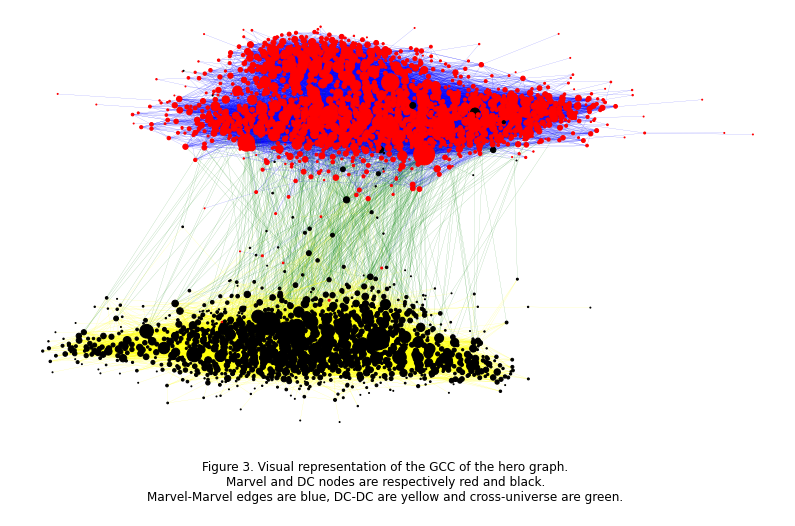

In [11]:
def get_node_color_map(graph):
    '''
    Returns node color map taking universe into account
    '''
    color_map = []
    for node in graph.nodes(data=True):
        color_map.append('red' if node[1]['universe'] == 'marvel' else 'black')
    return color_map


def get_node_size_map(graph):
    '''
    Returns size map taking node degree into account
    '''
    degrees = dict(graph.degree)
    return [v for v in degrees.values()]


def get_edge_color(graph, n1, n2):
    '''
    Return edge color between two nodes
    '''
    univ1, univ2 = graph.nodes[n1]['universe'], graph.nodes[n2]['universe']
    if univ1 == univ2 == 'marvel':
        return 'blue'
    if univ1 == univ2 == 'dc':
        return 'yellow'
    return 'green'


def get_edge_color_map(graph):
    '''
    Returns edge color map taking universe into account
    '''
    return [get_edge_color(graph, n1, n2) for n1, n2 in graph.edges]


# Create undirected graph, as it works better with Force Atlas 2
hero_undir = hero_graph.to_undirected()
plt.figure(figsize=(14, 8))
# Determine node positions using Force Atlas 2 and draw. Use default config.
positions = ForceAtlas2().forceatlas2_networkx_layout(hero_undir, pos=None, iterations=500)
nx.draw_networkx_nodes(
    hero_undir,
    positions,
    node_size=get_node_size_map(hero_undir),
    node_color=get_node_color_map(hero_undir))
nx.draw_networkx_edges(
    hero_undir,
    positions,
    width=0.1,
    edge_color=get_edge_color_map(hero_undir))
plt.axis('off')
caption = '''
Figure 3. Visual representation of the GCC of the hero graph.
Marvel and DC nodes are respectively red and black.
Marvel-Marvel edges are blue, DC-DC are yellow and cross-universe are green.
'''
plt.figtext(0.5, 0, caption, wrap=True, horizontalalignment='center', fontsize=12)
plt.show()


  > ### Answer:
  > The graph shows clear separation between two universes. On the other hand it is clear that they are somehow connected.

  # Exercise 2: Create your own version of the TF-TR word-clouds (from lecture 7). For this exercise we assume you know how to download and clean text from the wiki-pages.
  Here's what you need to do:
  ### That's it, really. The title says it all. Create your own version of the TF-TR word-clouds. Explain your process and comment on your results.

In [12]:
# Functions for building the wordclouds
def tokenize_text(text, remove_wikisyntax=False):
    '''
    Parsing given text: removing punctuation, creating tokens,
    setting to lowercase, removing stopwords, lemmatizing.
    Optionally remove wikisyntax, i.e. [[]], {{}}, <>
    '''
    if remove_wikisyntax:
        text = re.sub(r'\{\{.*?\}\}', '', text)
        text = re.sub(r'\[\[.*?\]\]', '', text)
        text = re.sub(r'\<.*?\>', '', text)
    text = text.translate(str.maketrans('', '', string.punctuation))
    tokens = word_tokenize(text)
    tokens = [token.lower() for token in tokens]
    tokens = [token for token in tokens if token not in stopwords.words('english')]

    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]

    return tokens


def get_tf_list(universe):
    '''
    Returns token frequency list for the given universe name
    '''
    try:
        print(f'Loading tf_{universe}.p')
        return pickle.load(open(f'tf_{universe}.p', 'rb'))
    except Exception:
        print('Loading failed. Recreating.')
    tf = {}
    for filename in glob.glob(f'{universe}/*.txt'):
        with io.open(filename, 'r', encoding='utf8') as f:
            tokens = tokenize_text(f.read(), True)
            for word, count in FreqDist(tokens).items():
                tf[word] = tf.setdefault(word, 0) + count
    pickle.dump(tf, io.open(f'tf_{universe}.p', 'wb'))
    return tf


def get_tr_tf_list(tf_main, tf_other):
    '''
    Returns TF-TR list
    '''
    c = 1
    tf_weighted = {}
    for word, count in tf_main.items():
        weight = int((count) / (tf_other.get(word, 0) + c))
        tf_weighted[word] = count * weight
    return tf_weighted


def create_wordcloud(text):
    '''
    Create a wordcloud based on a provided text.
    '''
    wordcloud = WordCloud(
        max_font_size=40,
        collocations=False,
        background_color='white',
    ).generate(text)
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()


def create_texts_from_list(word_weights):
    '''
    From the dict {word: weight} create a number of words depending on
    the weight - weight is rounded up to int.
    'text': 1.75 -> ['text', 'text']
    '''
    text = []
    for word, weight in word_weights.items():
        text.append(f'{word} ' * math.ceil(weight))
    return ' '.join(text)


Loading tf_marvel.p
Loading tf_dc.p


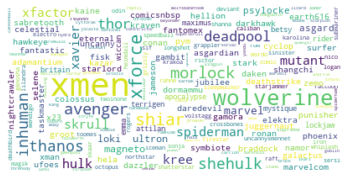

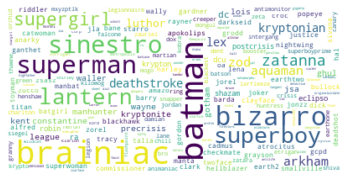

In [13]:
# Building the wordclouds
# Create simple token-frequency lists
tf = {}
for u in universes:
    tf[u] = get_tf_list(u)
# Calculate weighted TF-TR list
tf_tr = {
    'marvel': get_tr_tf_list(tf['marvel'], tf['dc']),
    'dc'    : get_tr_tf_list(tf['dc'], tf['marvel'])
}
# Build strings and create wordclouds out of them
for u in universes:
    s = create_texts_from_list(tf_tr[u])
    create_wordcloud(s)


  > ### Answer:
  > Creation process followed the instructions from lecture 7 with minor tweaks:
  > - while cleaning up, also any type of wikisyntax was removed, i.e. text between [[]], {{}} or <>
  > - as generating TF list takes long time, it is saved to pickle and retrieved in subsequent executions
  > - apart from that it, lecture notes were followed:
  >   - text was tokenized and cleaned
  >   - TF lists for both universes were calculated
  >   - TF-TR lists were generated for both universes
  >   - according to TF-TR score, proper strings were created
  >   - the strings were used to build the wordclouds
  >
  > Above wordclouds clearly show the most unique words for the given universes. When it comes to Marvel, despite popularity of Avengers: Endgame, X-Men & related (Wolverine, Xavier, Magneto) seem to be more frequently mentioned on Wikipedia. However, Avengers, Hulk, Thanos or Thor are also very popular there. Quite surprising hero here is Deadpool, which is clearly visible visible, especially compared to Spiderman, which is definitely more popular in the 'real' life.
  > In DC world, Superman and Batman are definitely very important characters. Also the Green Lantern (lantern, Sinestro) topic can be  easily noticed. Probably the most visible supervillain in that universe is Brainiac.
  >
  > More explanation regarding the creation process can be found in function docstrings.

  # Exercise 3: Find communities and create associated TF-IDF word clouds (from lecture 7 and 8). In this exercise, we assume that you have been able to find communities in your network. It's OK to only work on a single universe in this one.
  Here's what you need to do:

  ### Explain briefly how you chose to identify the communities: Which algorithm did you use, how does it work?

In [14]:
def find_communities_from(graph):
    '''
    Finding the communities, plotting them and printing the count.
    '''
    partition = community.best_partition(graph)
    count = len(set(partition.values()))

    print(f'No. of found communities: {count}')

    return partition


def get_subgraph_by_attribute(graph, attribute, value):
    '''
    Getting the subgraph basing on universe attribute
    '''

    nodes = (
        node
        for node, node_data
        in graph.nodes(data=True)
        if node_data.get(attribute) == value
    )

    return graph.subgraph(nodes)


def set_community_attribute(graph, attributes):
    '''
    Function for setting the community attribute to the character node.
    '''
    for hero in graph.nodes():
        graph.nodes[hero]['community'] = attributes[hero]

    return graph


  > ### Answer:
  To identify communities, the `community` package with the method `best_partition` was used. In this approach, firstly, a dendrogram is generated using the Louvain algorithm. The algorithm calculates the relative densities between the edges inside of the communities with respect to the outside edges. This algorithm is not optimal to be used when considering all possible iterations, thus a heuristic approach is performed. Then, the dendrogram is cut in the place of the highest partition, to obtain the highest modularity of the split.

  ### How many communities did you find in total?

  > ### Answer:
  We have found 11 communities in our set.

In [15]:
marvel_graph = get_subgraph_by_attribute(hero_undir, 'universe', 'marvel')
marvel_communities = find_communities_from(marvel_graph)
marvel_graph = set_community_attribute(marvel_graph, marvel_communities)


No. of found communities: 8


  ### Plot the distribution of community sizes.

In [16]:
def plot_community_distribution(universe, communities):
    '''
    Plot the distribution of the communities in chosen universe.
    '''

    data = [value for _, value in communities.items()]
    title = f'The {universe} communities size distribution'
    caption = f'Figure 4. The histogram is representing the number of members\nassigned to each community from the {universe} community.'
    values, bins = np.histogram(data, 11)
    plt.bar(bins[:-1], values, width=0.5)
    plt.title(title)
    plt.xlabel('Bin')
    plt.ylabel('Count')
    plt.grid()
    plt.figtext(0.5, -0.1, caption, wrap=True, horizontalalignment='center', fontsize=12)
    plt.show()


  > ### Answer:
   The plot representing the distribution of nodes in every community. The communities have different sizes, they are very small as well as very huge.

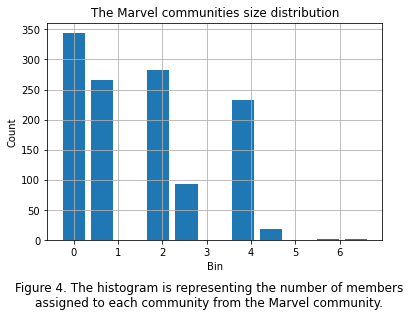

In [17]:
plot_community_distribution('Marvel', marvel_communities)


  ### For the 5-10 largest communities, create TF-IDF based rankings of words in each community. There are many ways to calculate TF-IDF, explain how you've done it and motivate your choices.

In [18]:
def get_biggest_communities(communities, amount):
    '''
    Return the nodes for given amount of biggest communities.
    '''

    data = [value for _, value in communities.items()]
    vector = list(range(np.min(data), np.max(data) + 2))
    graph_values, _ = np.histogram(data, bins=vector)
    biggest_communities = np.argsort(-graph_values)[:amount]

    return {k: v for k, v in communities.items() if v in biggest_communities}


def invert_dict(d):
    '''
    Helper function for inverting the dict structure to dict of lists.
    '''
    inverse = {}
    for key, item in d.items():
        if item not in inverse:
            inverse[item] = [key]
        else:
            inverse[item].append(key)
    return inverse


def tokenize_texts_for_communities(communities, universe):
    '''
    Concatenate the texts in each community and tokenize them.
    '''
    try:
        print(f'Loading {universe}_comm_tokens.p')
        return pickle.load(io.open(f'{universe}_comm_tokens.p', 'rb'))
    except Exception:
        print(f'Loading failed. Recreating.')
    texts = {}
    communities_inv = invert_dict(communities)
    for community, heroes in communities_inv.items():
        community_text = ''
        for hero in heroes:
            try:
                with io.open(f'{universe}/{hero}.txt', 'r', encoding='utf8') as f:
                    page_content = f.read()
                    community_text = f'{community_text}\n{page_content}'
            except FileNotFoundError:
                pass
        community_text = tokenize_text(community_text)
        texts[community] = community_text

    pickle.dump(texts, io.open(f'{universe}_comm_tokens.p', 'wb'))
    return texts


def calculate_tf_idf(dict_texts):
    '''
    Calculate tf-idf for each word in communities.
    '''
    try:
        print('Loading tf_idf.p')
        return pickle.load(io.open('tf_idf.p', 'rb'))
    except Exception:
        print('Loading failed. Recreating')
    tf_idf_communities = {}
    for index, current_text in tqdm(dict_texts.items()):
        tf_idf = FreqDist(current_text)
        other_texts = {key: dict_texts[key] for key in dict_texts.keys() if key != index}

        for word in tqdm(tf_idf.keys()):
            counter = 0
            for _, other_text in other_texts.items():
                if word in other_text:
                    counter += 1
            tf_idf[word] = tf_idf[word] * (
                        math.log(len(dict_texts.keys()) / (counter + 1), 10) + 1)

        tf_idf_communities[index] = tf_idf

    pickle.dump(tf_idf_communities, io.open('tf_idf.p', 'wb'))
    return tf_idf_communities


biggest_communities = get_biggest_communities(marvel_communities, 5)
tokenized_texts = tokenize_texts_for_communities(biggest_communities, 'marvel')
tf_idf = calculate_tf_idf(tokenized_texts)


Loading marvel_comm_tokens.p
Loading tf_idf.p


  > ### Answer:
  > The following formula was used: $tf(t, d) * idf(t, D) = f_{t, d} * (log(N / 1+n_t) + 1)$. The smooth logarithmic function was chosen because of its slow descending curve. The weights in tf-idf filter out the common terms, hence the value for base defines the "speed" of filtering out those terms.
  > The approach is the following:
  > * the documents in each community are concatenated,
  > * the text is tokenized, punctuation and stopwords are removed, lowercase is set, and lemmatization takes place,
  > * then the `tf` is calculated for each word in a community documents,
  > * each word in `tf` is checked in other documents and idf is calculated,
  > * each word weight is calculated.

  ### Create a word-cloud displaying the most important words in each community (according to TF-IDF). Comment on your results (do they make sense according to what you know about the superhero characters in those communities?)

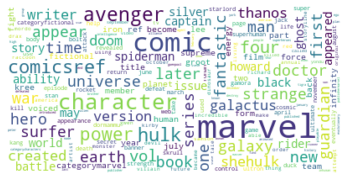

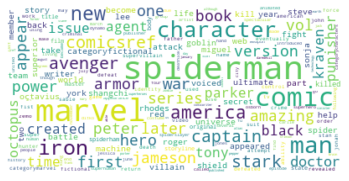

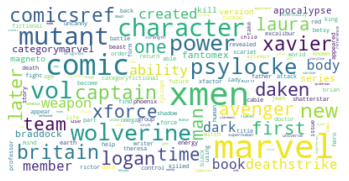

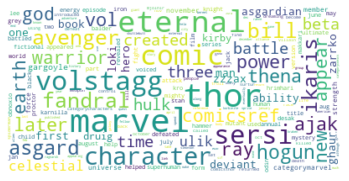

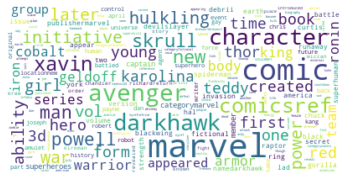

In [19]:
def create_communities_wordclouds(tf_idf):
    '''
    Creates wordclouds based on provided TD-IDF
    '''
    for index in tf_idf.keys():
        text = create_texts_from_list(tf_idf[index])
        create_wordcloud(text)


create_communities_wordclouds(tf_idf)


  > ### Answer:
  The following wordclouds were created:
  * General wordcloud for the Marvel universe. There are some important characters mentioned in the whole universe,
  * For Spider-Man, the following words occur – Peter, Parker, Jameson, America, Amazing ("The Amazing Spider-Man"), all of them are connected with this sub-universe,
  * For X-Men there are words like Wolverine, Logan, ability, mutant, which also makes sense for this set of connected pages,
  * The next one is about Thor's universe – words like God, Asgard, Avenger seem to be important here,
  * The last one seem to show another common words for the entire Marvel universe.

  # Exercise 4: Analyze the sentiment of the communities (lecture 8). Here, we assume that you've successfully identified communities. Unlike above - we work all communities. It's still OK to work with data from a single universe. More tips & tricks can be found, if you take a look at Lecture 8's exercises.
  A couple of additional instructions you will need below;
  - We name each community by its three most connected characters.
  - Average the average sentiment of the nodes in each community to find a community level sentiment.


  Here's what you need to do:

  ### Calculate and store sentiment for every single page.

In [20]:
def label_community_nodes(graph):
    '''
    Labelling the character nodes with the community name consisting of
    three characters with highest degree in the community.
    '''
    communities = [graph.nodes[hero]['community'] for hero in graph.nodes()]
    communities = set(communities)

    for community in communities:
        subgraph = [hero for hero in graph.nodes() if graph.nodes[hero]['community'] == community]
        subgraph = graph.subgraph(subgraph)
        names = sorted(subgraph.degree, key=lambda x: x[1], reverse=True)[:3]
        names = '-'.join([name[0] for name in names])
        nx.set_node_attributes(subgraph, names, 'community_name')

    return graph


def calculate_pages_sentiment(graph, universe):
    '''
    Calculating the sentiment for each of the character page and setting
    the value to the character node as an attribute.
    '''
    try:
        print(f'Loading {universe}_sent_graph.p')
        return pickle.load(io.open(f'{universe}_sent_graph.p', 'rb'))
    except:
        print('Loading failed. Recreating.')
    sentiment_url = 'https://journals.plos.org/plosone/article/file?id=10.1371/journal.pone.0026752.s001&type=supplementary'
    sentiment_values = pd.read_csv(sentiment_url, skiprows=3, delimiter='\t')[
        ['word', 'happiness_average']]

    for hero in tqdm(graph.nodes()):
        try:
            with io.open(f'{universe}/{hero}.txt', 'r', encoding='utf8') as f:
                page_content = f.read()
        except FileNotFoundError:
            continue

        text = tokenize_text(page_content)
        text = FreqDist(text)
        sentiment = pd.DataFrame.from_dict(text, orient='index').reset_index()
        sentiment.columns = ['word', 'count']
        sentiment = sentiment.merge(sentiment_values, on=['word'])
        if sentiment.empty:
            continue
        sentiment['mean'] = (sentiment['happiness_average'] * sentiment['count']).sum() / \
                            sentiment['count'].sum()
        graph.nodes[hero]['sentiment'] = sentiment['mean'].mean()

    pickle.dump(graph, io.open('{universe}_sent_graph.p', 'wb'))
    return graph


In [21]:
marvel_graph = label_community_nodes(marvel_graph)
marvel_graph = calculate_pages_sentiment(marvel_graph, 'marvel')


Loading marvel_sent_graph.p


  > ### Answer:
  In this section the sentiment for each page was calculated as well as the scores were assigned to the character nodes. The character nodes were also flagged with an attribute representing three mostly connected characters in the community which the node belongs to.

  ### Create a histogram of all character's associated page-sentiments.

In [22]:
def plot_sentiment_distribution(graph):
    '''
    Ploting the sentiment distribution amongst the characters' pages.
    '''
    sentiments = nx.get_node_attributes(graph, 'sentiment')
    title = f'The sentiment values distribution'
    caption = f'Figure 5. The histogram is representing the distribution\nof sentiment amongst the characters.'
    values, bins = np.histogram([value for value in sentiments.values() if value is not np.nan],
                                10)
    plt.bar(bins[:-1], values, width=0.08)
    plt.title(title)
    plt.xlabel('Bin')
    plt.ylabel('Count')
    plt.grid()
    plt.figtext(0.5, -0.1, caption, wrap=True, horizontalalignment='center', fontsize=12)
    plt.show()


  > ### Answer:
  The histogram shows that the data is normally distributed amongst the nodes. Moreover, the score of sentiment distribution is the highest at 5.5, which indicates that the average sentiment of pages is centered around that value.

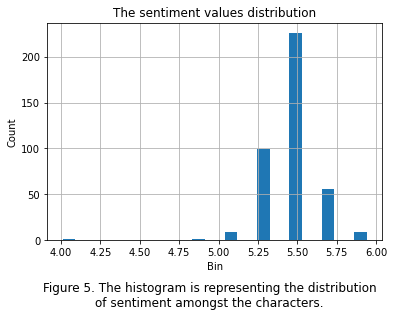

In [23]:
plot_sentiment_distribution(marvel_graph)


  ### What are the 10 characters with happiest and saddest pages?

In [24]:
sentiments_df = pd.DataFrame.from_dict(dict(marvel_graph.nodes(data=True)), orient='index')
sentiments_df = sentiments_df.dropna(subset=['sentiment'])


  > ### Answer:
  > Happiest:

In [25]:
sentiments_df.sort_values(by='sentiment', ascending=False).head(10)


,universe,community,community_name,sentiment
Crimson Cavalier,marvel,0,Hulk-Doctor Strange-Thing (comics),6.106667
Skornn,marvel,3,Wolverine (character)-Professor X-Cyclops (Mar...,6.073333
Super Rabbit,marvel,1,Spider-Man-Captain America-Iron Man,6.073322
Honey Lemon,marvel,1,Spider-Man-Captain America-Iron Man,6.043770
Lorna the Jungle Girl,marvel,1,Spider-Man-Captain America-Iron Man,5.952218
Elysius,marvel,0,Hulk-Doctor Strange-Thing (comics),5.946043
Bereet,marvel,4,Thor (Marvel Comics)-Asgard (comics)-Loki (com...,5.927868
Gorr the Golden Gorilla,marvel,0,Hulk-Doctor Strange-Thing (comics),5.910258
Kid Colt,marvel,6,Deadpool-Squirrel Girl-Flatman (comics),5.908869
Llan the Sorcerer,marvel,7,Sasquatch (comics)-Vindicator (comics)-Shaman ...,5.875000


  > Saddest:

In [26]:
sentiments_df.sort_values(by='sentiment', ascending=True).head(10)


,universe,community,community_name,sentiment
Death-Stalker,marvel,1,Spider-Man-Captain America-Iron Man,4.050000
Shathra,marvel,1,Spider-Man-Captain America-Iron Man,4.998333
Dark Beast,marvel,3,Wolverine (character)-Professor X-Cyclops (Mar...,5.106427
Savage Steel,marvel,1,Spider-Man-Captain America-Iron Man,5.151732
N'Garai,marvel,0,Hulk-Doctor Strange-Thing (comics),5.153333
Killer Shrike,marvel,1,Spider-Man-Captain America-Iron Man,5.185840
Razor Fist,marvel,1,Spider-Man-Captain America-Iron Man,5.201174
Weapon H,marvel,3,Wolverine (character)-Professor X-Cyclops (Mar...,5.227486
Styx and Stone,marvel,0,Hulk-Doctor Strange-Thing (comics),5.250000
Fasaud,marvel,1,Spider-Man-Captain America-Iron Man,5.270000


  ### What are the three happiest communities?

In [27]:
sentiments_df_agg = sentiments_df.groupby('community_name').mean()
sentiments_df_agg = sentiments_df_agg.drop(['community'], axis=1)


  > ### Answer:

In [28]:
sentiments_df_agg.sort_values(by='sentiment', ascending=False).head(3)


,sentiment
community_name,
Sasquatch (comics)-Vindicator (comics)-Shaman (comics),5.762290
Deadpool-Squirrel Girl-Flatman (comics),5.685873
Rockman (comics)-Phantom Reporter-Captain Wonder (Timely Comics),5.635182


  ### What are the three saddest communities?

  > ### Answer:

In [29]:
sentiments_df_agg.sort_values(by='sentiment', ascending=True).head(3)


,sentiment
community_name,
Marvel 2099-Doom 2099-X-Men 2099#Serpentina,5.489037
Red Skull-Bucky Barnes-Human Torch (android),5.505661
Spider-Man-Captain America-Iron Man,5.526692


  ### Do these results confirm what you can learn about each community by skimming the wikipedia pages?

  > ### Answer:
  > The pages for three mostly connected characters from community name are quite short, comparing to the saddest ones. It may be caused by the amount of text and detailed description of the characters, episodes, situations. Low sentiment is generated by words like 'kill', 'fight', and those are more frequent in longer pages.